<img src="https://github.com/nicholasmetherall/digital-earth-pacific-macblue-activities/blob/main/attachments/images/DE_Pacific_banner.JPG?raw=true" width="900"/>
Figure 1.1.a. Jupyter environment + Python notebooks

### Digital Earth Pacific Notebook 1 Train Random Forest Machine Learning (ML) Model

<font color='green'>The objective of this notebook is to train a machine learning model that will allow us to classify an area with the land cover classes defined through the training data. </font>

<font color='blue'>Setup libaries</font>

In [1]:
from pystac_client import Client
from dask.distributed import Client as DaskClient
from odc.stac import load, configure_s3_access
import rasterio as rio
import geopandas as gpd
import pandas as pd
import numpy as np
import xarray as xr
import folium
import utils
from utils import load_data
from utils import mask_and_scale
from sklearn.ensemble import RandomForestClassifier
import odc.geo.xr
import rioxarray
import matplotlib.pyplot as plt

<font color='blue'>Define catalogue</font>

In [2]:
catalogue = "https://earth-search.aws.element84.com/v1"
client = Client.open(catalogue)

<font color='red'>Define your area of interest - copy and paste the bottom left latitude (min_lat) and the bottem left longitude (min_lon) and the top right latitude (max_lat) and the top right longitude (max_lon)

<font color='red'>In this activity you can use the following examples: 
`-18.1313, -18.1553, 177.4347, 177.4032`
  
<font color='red'>  Note we have reordered these into the wrong order so you will have to define them correctly below:</font>

In [3]:
min_lat = -18.20459
min_lon = 178.33041
max_lat = -18.10000 
max_lon = 178.53506
bbox = [min_lon, min_lat, max_lon, max_lat]

<font color='red'>Define your time of interest - choose a range of a few months in 2024 using the syntax `datetime="YYYY-MM/YYYY-MM"`</font>

In [4]:
datetime="2024-01/2024-12"

<font color='red'>Connect to parallel computers for greater computational capacity - note you should only run this line of code once per notebook activity - do not rerun this line</font>

In [5]:
dask_client = DaskClient(n_workers=1, threads_per_worker=16, memory_limit='16GB')

configure_s3_access(cloud_defaults=True, requester_pays=True)

<font color='green'>Define your training data by entering the name of the data marine_tdata_yanuca_rf.geojson and the column of your attribute table you wish to read the data from noting this should be an integer. First enter the full file name including format inside the brackets `("file.geojson")` . Next you will have to name the column properly `column="column_name"`</font>

In [6]:
# # Define training data
# # 1
# gdf = gpd.read_file("")

# gdf = gdf.to_crs("EPSG:4326")

# # 2
# gdf.explore(column="", legend=True)


<font color='green'>Count the number of points in your dataset using the function `print(len(variable))`</font>

<font color='green'>Search through the catalogue - define the cloud cover threshold you want. Try changing 80 to 50 here: `{"lt": 50}},` </font>

In [7]:
# Search through catalogue for relevant data
items = client.search(
    collections=["sentinel-2-c1-l2a"],
    bbox=bbox,
    datetime=datetime,
    query={"eo:cloud_cover":{"lt": 10}},
).item_collection()

print(f"Found {len(items)} items")


Found 14 items


<font color='blue'>Load your satellite dataset based on your search parameters defined above</font>

In [8]:
# data = utils.load_data
data = load_data(items, bbox)

<font color='blue'>Set scale and masks and consider the dataset information below including the bands used for analysis:</font>

In [9]:
scaled = mask_and_scale(data)
scaled

<xarray.Dataset> Size: 1GB
Dimensions:      (time: 10, y: 1176, x: 2175)
Coordinates:
  * y            (y) float64 9kB 7.998e+06 7.998e+06 ... 7.987e+06 7.986e+06
  * x            (x) float64 17kB 6.407e+05 6.407e+05 ... 6.624e+05 6.624e+05
    spatial_ref  int32 4B 32760
  * time         (time) datetime64[ns] 80B 2024-04-12T22:20:59.331000 ... 202...
Data variables: (12/13)
    red          (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    green        (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    blue         (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    nir08        (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    swir16       (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    scl          (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    ...           ...
    nir09        (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    cloud        (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    rededge1     (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    rededge3     (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    rededge2     (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>
    nir          (time, y, x) float32 102MB dask.array<chunksize=(1, 1176, 2048), meta=np.ndarray>

<font color='blue'>Explore the satellite image dataset you have loaded</font>

In [14]:
scaled.isel(time=4).odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


In [ ]:
single_image = scaled.isel(time 

<font color='blue'>Generate a median image dataset</font>

In [11]:
median = scaled.median("time").compute()
median_image = median.assign_coords(band=["coastal", "red", "green", "blue", "nir", "swir1", "swir2"])

In [12]:
median.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


In [13]:
median_image

<xarray.Dataset> Size: 133MB
Dimensions:      (y: 1176, x: 2175, band: 7)
Coordinates:
  * y            (y) float64 9kB 7.998e+06 7.998e+06 ... 7.987e+06 7.986e+06
  * x            (x) float64 17kB 6.407e+05 6.407e+05 ... 6.624e+05 6.624e+05
    spatial_ref  int32 4B 32760
  * band         (band) <U7 196B 'coastal' 'red' 'green' ... 'swir1' 'swir2'
Data variables: (12/13)
    red          (y, x) float32 10MB 0.1161 0.1196 0.1235 ... 0.1069 0.1069
    green        (y, x) float32 10MB 0.1351 0.1434 0.1477 ... 0.1131 0.1144
    blue         (y, x) float32 10MB 0.1214 0.1221 0.128 ... 0.1277 0.1292
    nir08        (y, x) float32 10MB 0.4632 0.4632 0.5139 ... 0.1065 0.1065
    swir16       (y, x) float32 10MB 0.2418 0.2418 0.2606 ... 0.1065 0.1068
    scl          (y, x) float32 10MB 0.0004 0.0004 0.0004 ... 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 10MB 0.4428 0.4428 0.4428 ... 0.0947 0.0947
    cloud        (y, x) float32 10MB 0.0008 0.0008 0.0023 ... 0.0045 0.0046
    rededge1     (y, x) float32 10MB 0.1733 0.1733 0.1871 ... 0.1086 0.1089
    rededge3     (y, x) float32 10MB 0.4341 0.4341 0.4903 ... 0.1092 0.1088
    rededge2     (y, x) float32 10MB 0.3652 0.3652 0.4093 ... 0.108 0.108 0.108
    nir          (y, x) float32 10MB 0.3864 0.422 0.4872 ... 0.1054 0.1057

<font color='red'>The formula for the Modified Normalized Difference Water Index (MDNWI) is: 

- <font color='red'>\(MNDWI=(Green-SWIR)/(Green+SWIR)\)

<font color='red'>Define a variable to store both MNDWI and NDTI using the median xarray dataset

In [14]:
mndwi = (median_image["green"]-median_image["swir16"])/(median_image["green"]+median_image["swir16"])


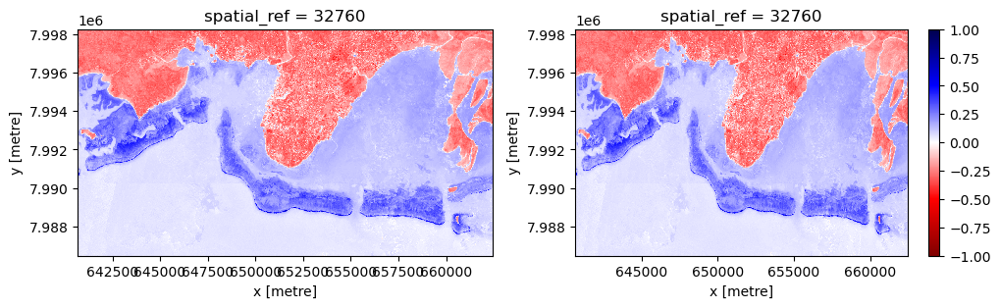

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
cmap_mndwi='seismic_r'

vmin=-1
vmax=1

mndwi.plot(ax=ax[0], cmap=cmap_mndwi, add_colorbar=False, vmin=vmin, vmax=vmax)
mndwi.plot(ax=ax[1], cmap=cmap_mndwi, add_colorbar=True, vmin=vmin, vmax=vmax);

In [16]:
mndwi.odc.explore(cmap='seismic_r', vmin=-1, vmax=1)


<font color='red'>Generate and visualise a mask to exclude land from your analysis. Note, inside the  rio.open() function enter the Near Infrared file using the syntex : `rio.open('median_nir.tif')`</font>

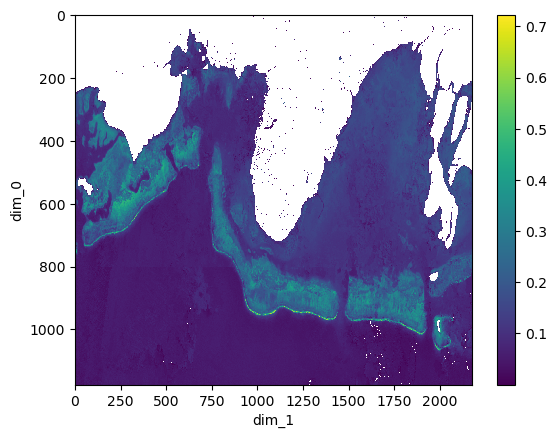

In [17]:
land_mask = mndwi > 0
masked_raster = np.ma.masked_where(~land_mask, mndwi)
masked_raster_da = xr.DataArray(masked_raster)
masked_raster_da.plot.imshow(origin="upper")

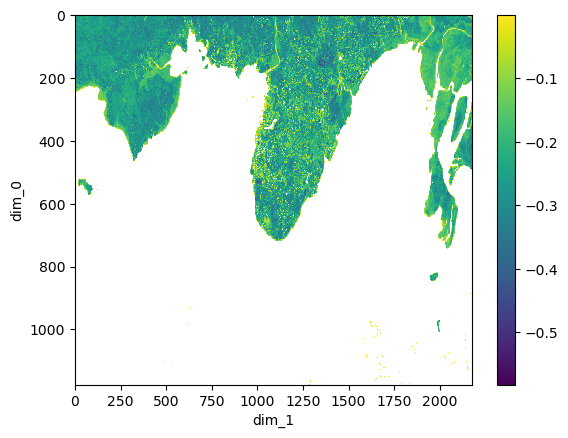

In [18]:
ocean_mask = mndwi < 0
masked_raster = np.ma.masked_where(~ocean_mask, mndwi)
masked_raster_da = xr.DataArray(masked_raster)
masked_raster_da.plot.imshow(origin="upper")

In [25]:
# Clip da1 using the mask from da2
clipped_da = median.where(land_mask)
clipped_da


<xarray.Dataset> Size: 133MB
Dimensions:      (y: 1176, x: 2175)
Coordinates:
  * y            (y) float64 9kB 7.998e+06 7.998e+06 ... 7.987e+06 7.986e+06
  * x            (x) float64 17kB 6.407e+05 6.407e+05 ... 6.624e+05 6.624e+05
    spatial_ref  int32 4B 32760
Data variables: (12/13)
    red          (y, x) float32 10MB nan nan nan nan ... 0.1059 0.1069 0.1069
    green        (y, x) float32 10MB nan nan nan nan ... 0.1141 0.1131 0.1144
    blue         (y, x) float32 10MB nan nan nan nan ... 0.1284 0.1277 0.1292
    nir08        (y, x) float32 10MB nan nan nan nan ... 0.1065 0.1065 0.1065
    swir16       (y, x) float32 10MB nan nan nan nan ... 0.1065 0.1065 0.1068
    scl          (y, x) float32 10MB nan nan nan nan ... 0.0006 0.0006 0.0006
    ...           ...
    nir09        (y, x) float32 10MB nan nan nan nan ... 0.0947 0.0947 0.0947
    cloud        (y, x) float32 10MB nan nan nan nan ... 0.0045 0.0045 0.0046
    rededge1     (y, x) float32 10MB nan nan nan nan ... 0.1086 0.1086 0.1089
    rededge3     (y, x) float32 10MB nan nan nan nan ... 0.1092 0.1092 0.1088
    rededge2     (y, x) float32 10MB nan nan nan nan ... 0.108 0.108 0.108
    nir          (y, x) float32 10MB nan nan nan nan ... 0.1059 0.1054 0.1057

In [20]:
clipped_da.odc.explore(bands=("red", "green", "blue"), vmin=0, vmax=0.3)


/srv/conda/envs/notebook/lib/python3.10/site-packages/odc/geo/_rgba.py:56: RuntimeWarning: invalid value encountered in cast
  return x.astype("uint8")


<font color='red'>The formula for the Normalized Difference Turbidity Index (NDTI) index is: 

- <font color='red'>\(NDTI = (Red - Green) / (Red + Green)\)

In [21]:
ndti = (clipped_da["red"]-clipped_da["green"])/(clipped_da["red"]+clipped_da["green"])


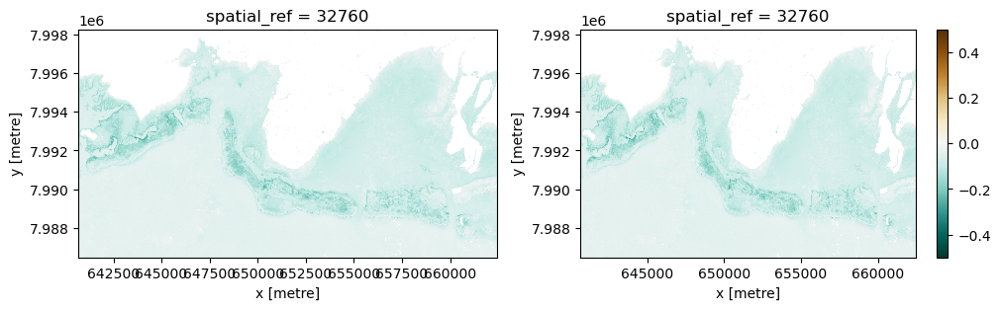

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(12, 3))
cmap_ndti='BrBG_r'

vmin=-0.5
vmax=0.5

ndti.plot(ax=ax[0], cmap=cmap_ndti, add_colorbar=False, vmin=vmin, vmax=vmax)
ndti.plot(ax=ax[1], cmap=cmap_ndti, add_colorbar=True, vmin=vmin, vmax=vmax);

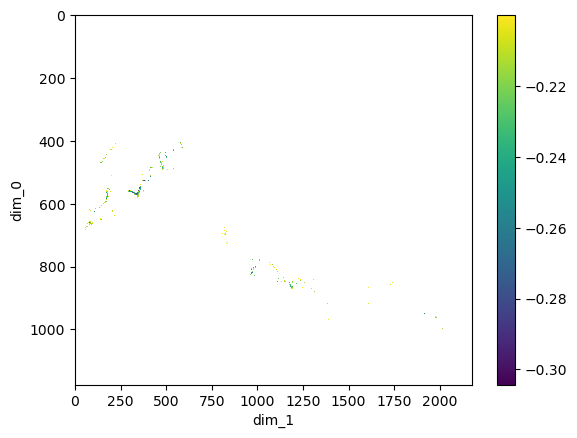

In [23]:
ndti_mask = ndti < -0.2
ndti_masked_raster = np.ma.masked_where(~ndti_mask, ndti)
ndti_masked_raster_da = xr.DataArray(ndti_masked_raster)
ndti_masked_raster_da.plot.imshow(origin="upper")

### Congratulations you have completed this activity. Let the instructors know if you have any questions. Otherwise, move onto the next activity 

<font color='green'>The objective of this notebook was to train the machine learning model that will allow us to classify an area with land cover classes defined through the training data. </font>

<font color='blue'>Finished</font>

In [24]:
print("Finished, well done")

Finished, well done
